# Electric Vehicle Analysis
### 🚘 Task 1:
This is an open ended problem. Apply Exploratory Data, Analysis (Univariate and Bivariate) on the dataset available above.

In [3]:
# Install required libraries -
#!pip install numpy pandas matplotlib seaborn plotly bar-chart-race ffmpeg-python

In [4]:
# Import libraries -
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import bar_chart_race as bcr
from IPython.display import Image

warnings.filterwarnings("ignore", category=UserWarning)

In [5]:
# Load dataset -
data = pd.read_csv("dataset.csv")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [6]:
# Display dataset -
data.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


#### Univarient Analysis

In [8]:
# 1. Summary Statistics for Numeric Columns
summary_stats = data[['Electric Range', 'Base MSRP', 'Model Year']].describe()
summary_stats

,Electric Range,Base MSRP,Model Year
count,112634.000000,112634.000000,112634.000000
mean,87.812987,1793.439681,2019.003365
std,102.334216,10783.753486,2.892364
min,0.000000,0.000000,1997.000000
25%,0.000000,0.000000,2017.000000
50%,32.000000,0.000000,2020.000000
75%,208.000000,0.000000,2022.000000
max,337.000000,845000.000000,2023.000000


In [9]:
# Mode for numerical columns
modes = data[['Electric Range', 'Base MSRP', 'Model Year']].mode().iloc[0]
print(f"Mode for Electric Range, Base MSRP, Model Year: \n{modes}")

Mode for Electric Range, Base MSRP, Model Year: 
Electric Range       0
Base MSRP            0
Model Year        2022
Name: 0, dtype: int64


In [10]:
# 2. Frequency Distribution for Categorical Columns
make_counts = data['Make'].value_counts()
model_counts = data['Model'].value_counts()
state_counts = data['State'].value_counts()

print(f"\nFrequency Distribution for 'Make':\n{make_counts}")
print(f"\nFrequency Distribution for 'Model':\n{model_counts}")
print(f"\nFrequency Distribution for 'State':\n{state_counts}")


Frequency Distribution for 'Make':
TESLA             52078
NISSAN            12880
CHEVROLET         10182
FORD               5819
BMW                4680
KIA                4483
TOYOTA             4405
VOLKSWAGEN         2514
AUDI               2332
VOLVO              2288
CHRYSLER           1794
HYUNDAI            1412
JEEP               1152
RIVIAN              885
FIAT                822
PORSCHE             818
HONDA               792
MINI                632
MITSUBISHI          588
POLESTAR            558
MERCEDES-BENZ       506
SMART               273
JAGUAR              219
LINCOLN             168
CADILLAC            108
LUCID MOTORS         65
SUBARU               59
LAND ROVER           38
LEXUS                33
FISKER               20
GENESIS              18
AZURE DYNAMICS        7
TH!NK                 3
BENTLEY               3
Name: Make, dtype: int64

Frequency Distribution for 'Model':
MODEL 3        23135
MODEL Y        17142
LEAF           12880
MODEL S         7377
BO

In [11]:
# 3. Missing Values
missing_values = data.isnull().sum()
print(f"\nMissing Values in Dataset:\n{missing_values}")


Missing Values in Dataset:
VIN (1-10)                                             0
County                                                 0
City                                                   0
State                                                  0
Postal Code                                            0
Model Year                                             0
Make                                                   0
Model                                                 20
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 286
DOL Vehicle ID                                         0
Vehicle Location                                      24
Electric Utility                                     443
2020 Census Tract                                      0
dty

<Axes: >

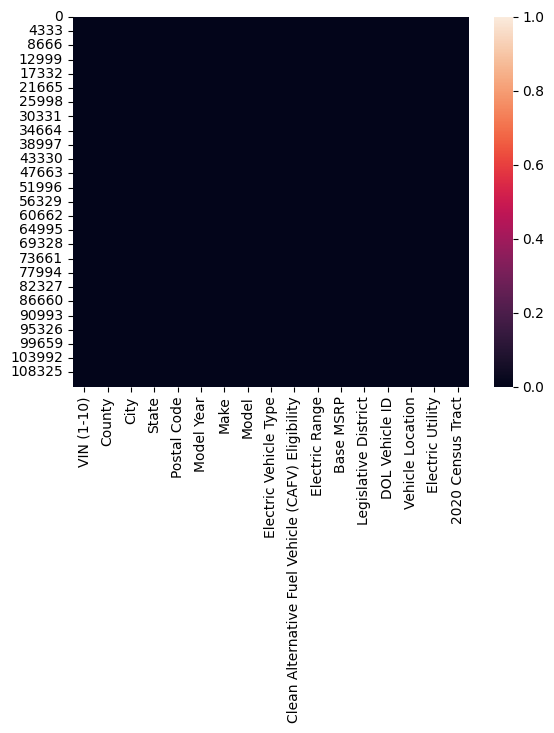

In [12]:
# Plot this -
sns.heatmap(data.isnull())

In [13]:
# Remove Null Values -
data = data.dropna()
data.isnull().sum()

VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64

<Axes: >

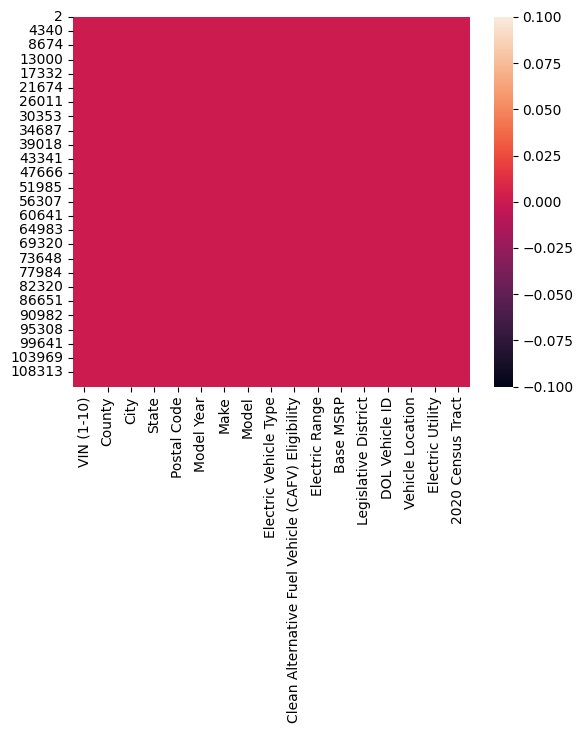

In [14]:
# Plot this -
sns.heatmap(data.isnull())

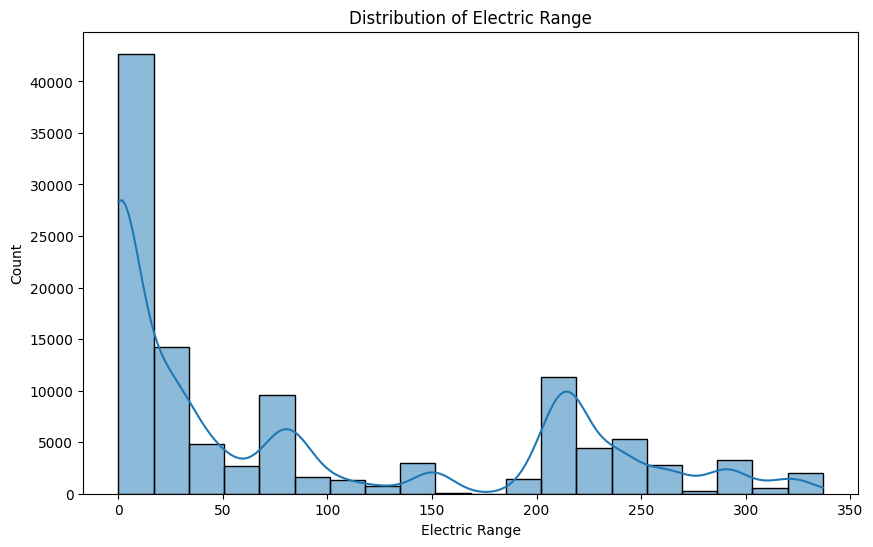

In [15]:
# Histograms for Numeric Variables
plt.figure(figsize=(10,6))
sns.histplot(data['Electric Range'], bins=20, kde=True)
plt.title('Distribution of Electric Range')
plt.show()


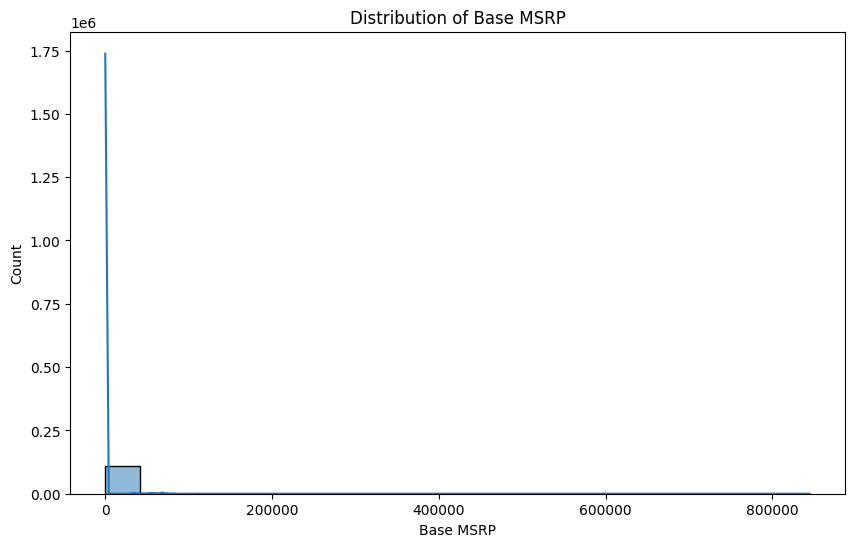

In [16]:
plt.figure(figsize=(10,6))
sns.histplot(data['Base MSRP'], bins=20, kde=True)
plt.title('Distribution of Base MSRP')
plt.show()


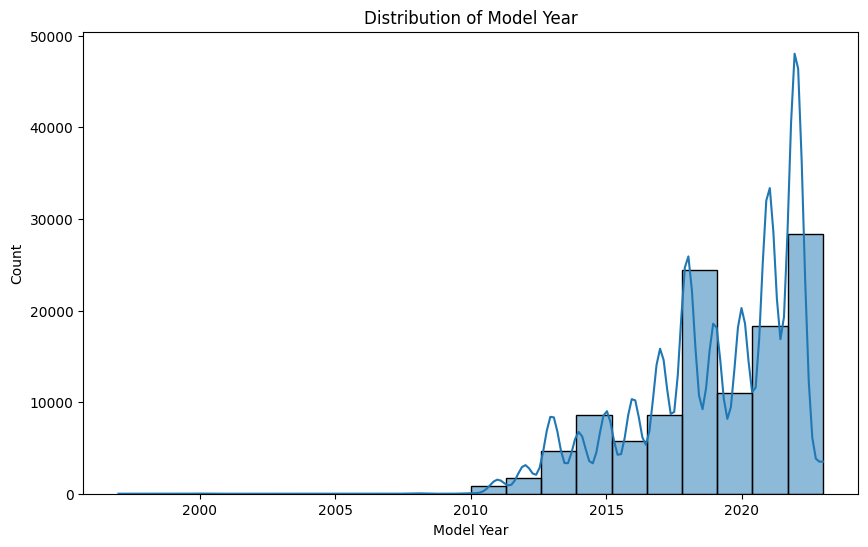

In [17]:
plt.figure(figsize=(10,6))
sns.histplot(data['Model Year'], bins=20, kde=True)
plt.title('Distribution of Model Year')
plt.show()


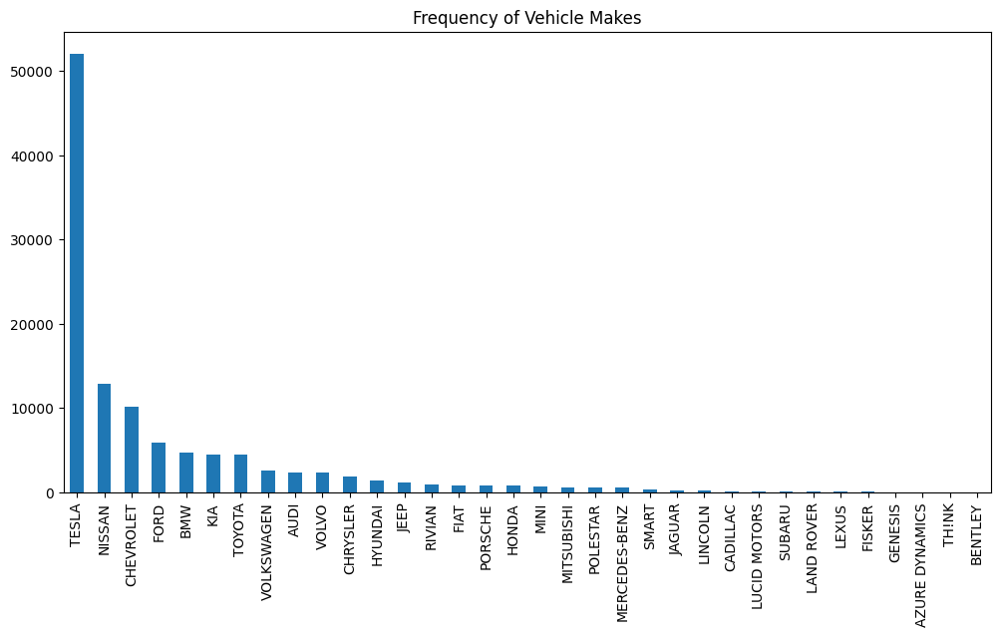

In [18]:
# Bar Charts for Categorical Variables
plt.figure(figsize=(12,6))
make_counts.plot(kind='bar')
plt.title('Frequency of Vehicle Makes')
plt.xticks(rotation=90)
plt.show()

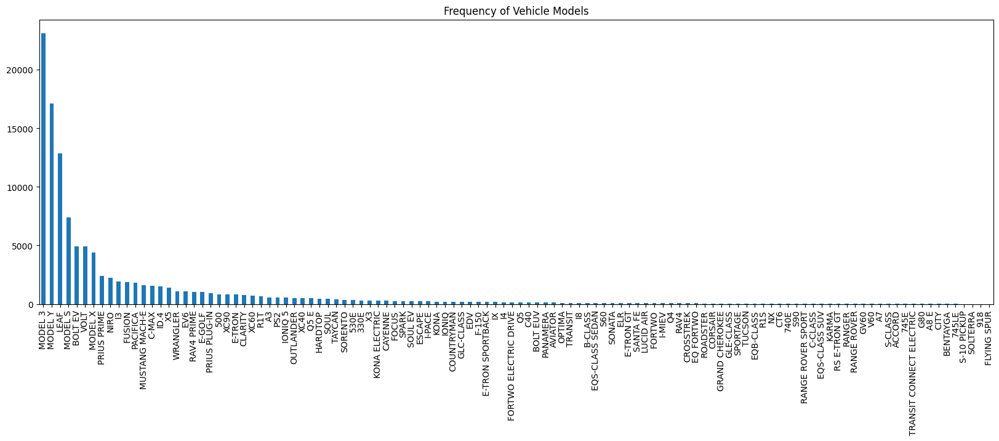

In [19]:
plt.figure(figsize=(20,6))
model_counts.plot(kind='bar')
plt.title('Frequency of Vehicle Models')
plt.xticks(rotation=90)
plt.show()

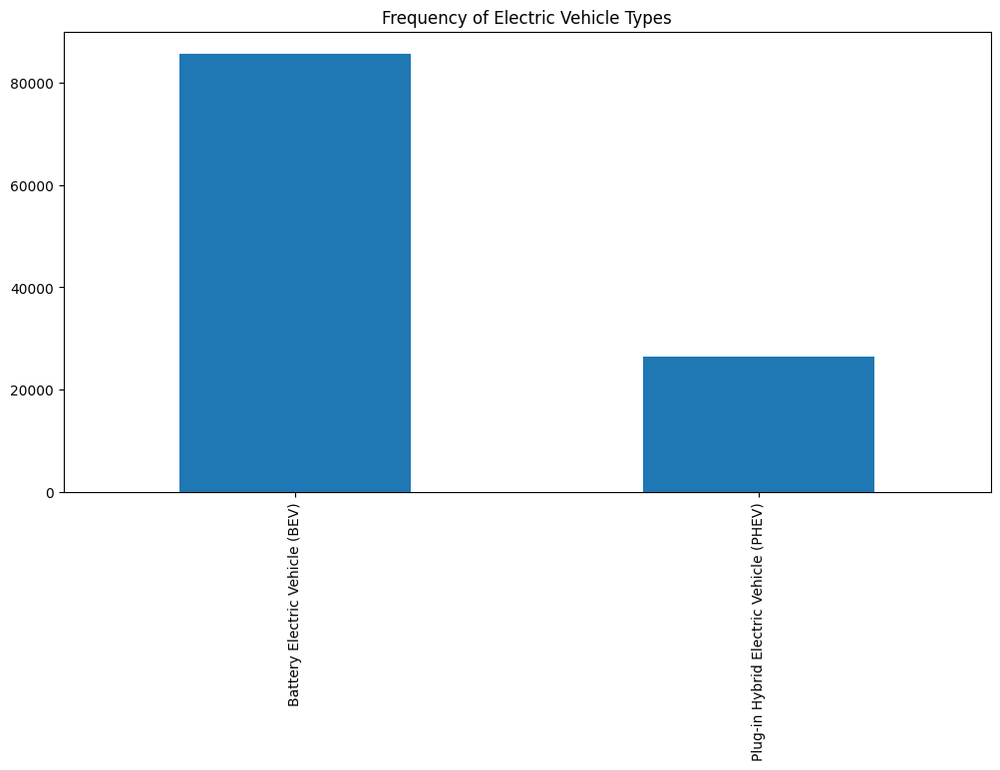

In [20]:
plt.figure(figsize=(12,6))
data['Electric Vehicle Type'].value_counts().plot(kind='bar')
plt.title('Frequency of Electric Vehicle Types')
plt.xticks(rotation=90)
plt.show()

#### Biverient Analysis

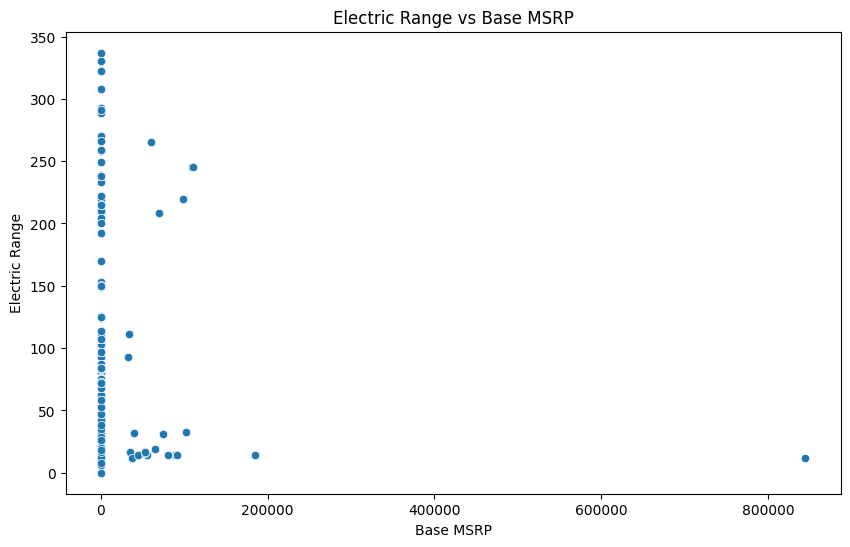

In [22]:
# 1. Numeric vs Numeric
# Scatter plot for Electric Range vs Base MSRP
plt.figure(figsize=(10,6))
sns.scatterplot(x='Base MSRP', y='Electric Range', data=data)
plt.title('Electric Range vs Base MSRP')
plt.show()

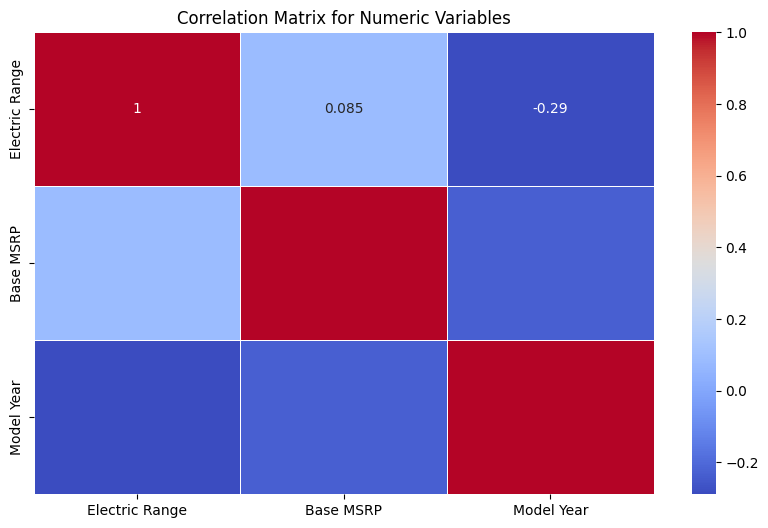

In [23]:
# Correlation Matrix for numeric columns
plt.figure(figsize=(10,6))
correlation_matrix = data[['Electric Range', 'Base MSRP', 'Model Year']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix for Numeric Variables')
plt.show()

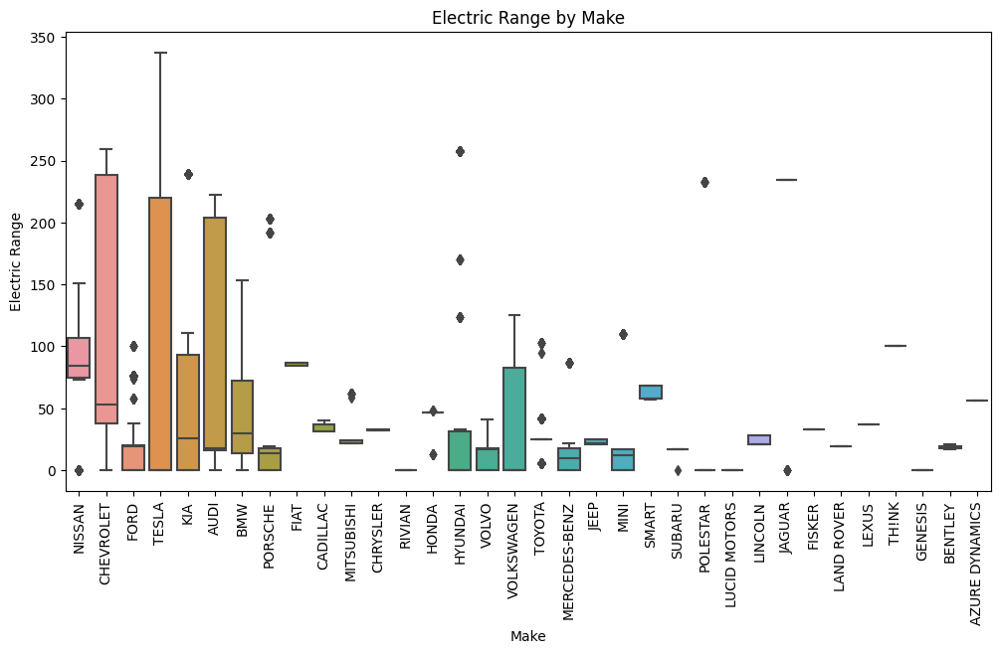

In [24]:
# 2. Categorical vs Numeric

# Box plot for Make vs Electric Range
plt.figure(figsize=(12,6))
sns.boxplot(x='Make', y='Electric Range', data=data)
plt.title('Electric Range by Make')
plt.xticks(rotation=90)
plt.show()

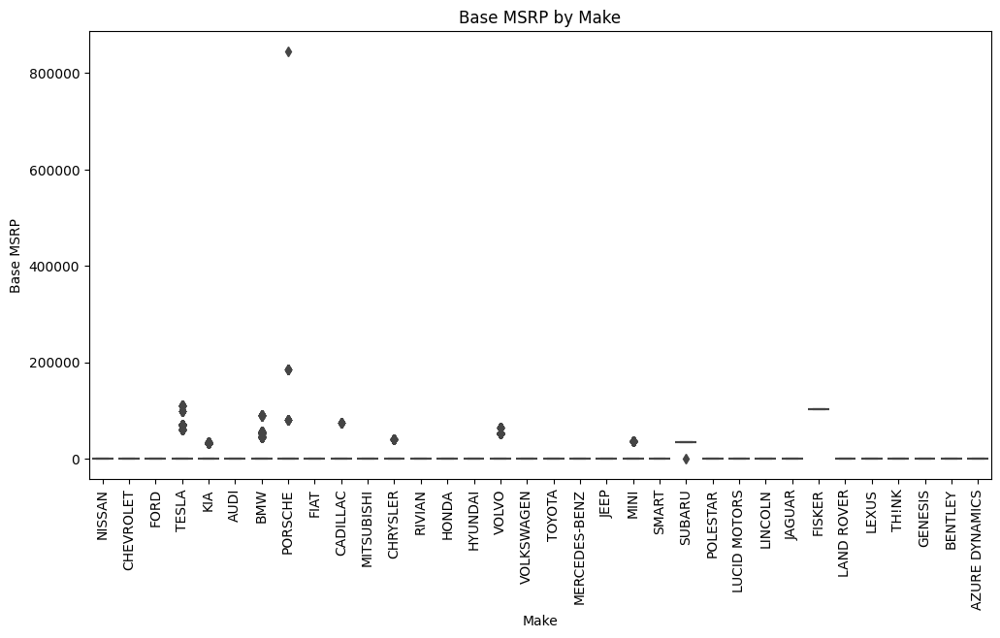

In [25]:
# Box plot for Make vs Base MSRP
plt.figure(figsize=(12,6))
sns.boxplot(x='Make', y='Base MSRP', data=data)
plt.title('Base MSRP by Make')
plt.xticks(rotation=90)
plt.show()

In [26]:
data.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

<Figure size 1000x600 with 0 Axes>

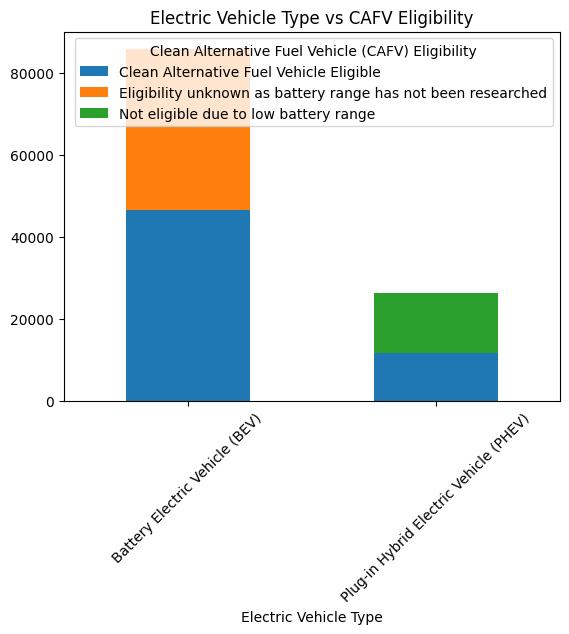

In [27]:
# Grouped Bar plot for Electric Vehicle Type vs CAFV Eligibility
plt.figure(figsize=(10,6))
pd.crosstab(data['Electric Vehicle Type'], data['Clean Alternative Fuel Vehicle (CAFV) Eligibility']).plot(kind='bar', stacked=True)
plt.title('Electric Vehicle Type vs CAFV Eligibility')
plt.xticks(rotation=45)
plt.show()

In [28]:
# 3. Categorical vs Categorical

# Cross-tabulation: Electric Vehicle Type vs CAFV Eligibility
crosstab = pd.crosstab(data['Electric Vehicle Type'], data['Clean Alternative Fuel Vehicle (CAFV) Eligibility'])
print(f"\nCross-tabulation between Electric Vehicle Type and CAFV Eligibility:\n{crosstab}")


Cross-tabulation between Electric Vehicle Type and CAFV Eligibility:
Clean Alternative Fuel Vehicle (CAFV) Eligibility  Clean Alternative Fuel Vehicle Eligible  \
Electric Vehicle Type                                                                        
Battery Electric Vehicle (BEV)                                                       46626   
Plug-in Hybrid Electric Vehicle (PHEV)                                               11769   

Clean Alternative Fuel Vehicle (CAFV) Eligibility  Eligibility unknown as battery range has not been researched  \
Electric Vehicle Type                                                                                             
Battery Electric Vehicle (BEV)                                                                 39097              
Plug-in Hybrid Electric Vehicle (PHEV)                                                             0              

Clean Alternative Fuel Vehicle (CAFV) Eligibility  Not eligible due to low battery range  
E

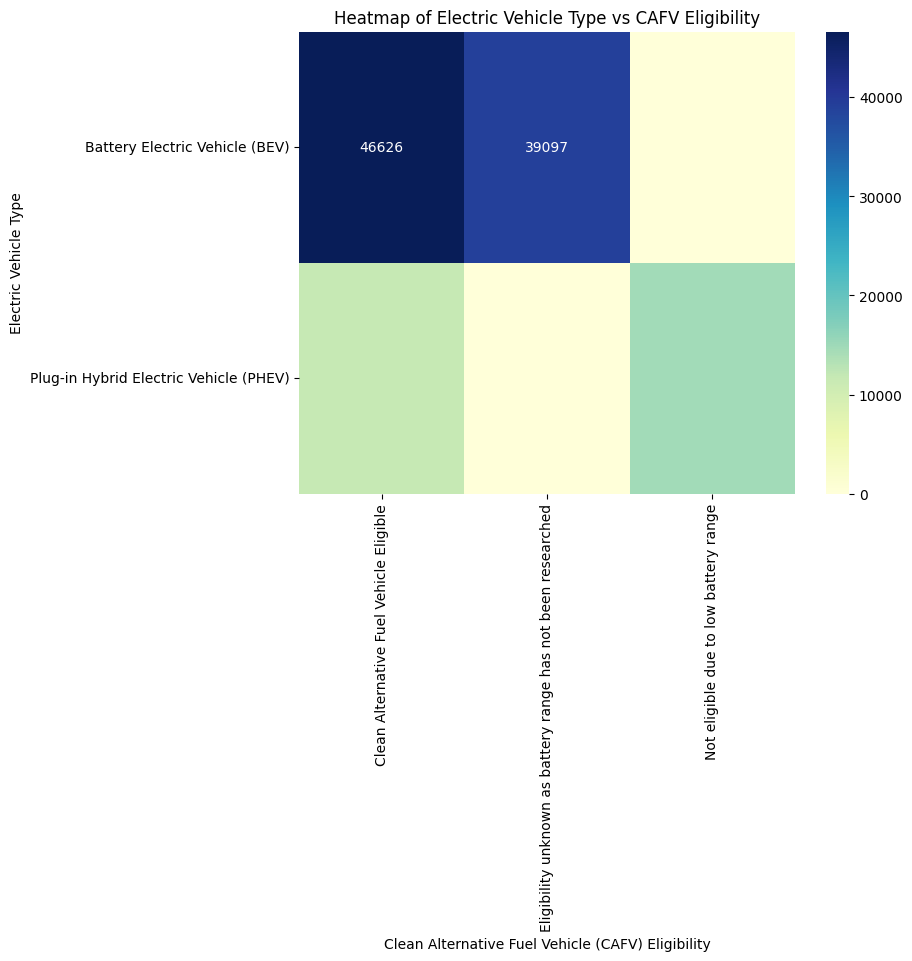

In [29]:
# Heatmap for Categorical Variables
plt.figure(figsize=(8,6))
sns.heatmap(crosstab, annot=True, cmap='YlGnBu', fmt='d')
plt.title('Heatmap of Electric Vehicle Type vs CAFV Eligibility')
plt.show()

### 🚘 Task 2: 
Create a Choropleth using plotly.express to display the, number of EV vehicles based on location.

In [31]:
data.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,POINT (-122.23019 47.94949),PUGET SOUND ENERGY INC,53061040900


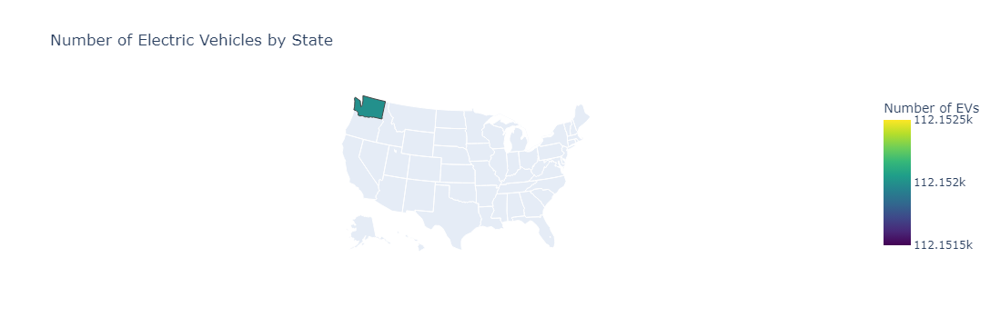

In [32]:
# Aproch 1

# Step 1: Aggregate Data by State
ev_counts_by_state = data.groupby('State').size().reset_index(name='EV Count')

# Step 2: Create Choropleth Map
fig = px.choropleth(
    ev_counts_by_state,  # Data
    locations='State',  # Column with state abbreviations
    locationmode='USA-states',  # Tells plotly we're using US state abbreviations
    color='EV Count',  # Variable to use for color intensity
    color_continuous_scale="Viridis",  # Color scale
    scope="usa",  # Focus on the USA
    title="Number of Electric Vehicles by State",
    labels={'EV Count':'Number of EVs'}  # Label for color bar
)

# Show the plot
fig.show()

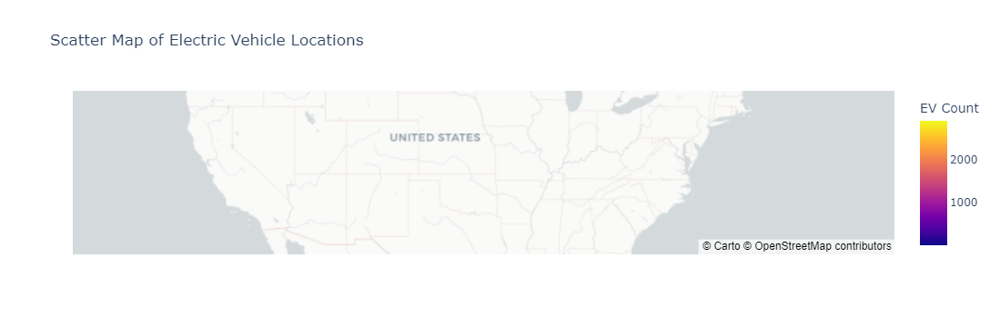

In [33]:
# Approch 2
data['Longitude'] = data['Vehicle Location'].apply(lambda loc: float(loc.split()[1][1:]))
data['Latitude'] = data['Vehicle Location'].apply(lambda loc: float(loc.split()[2][:-1]))

location_counts = data.groupby(['Latitude', 'Longitude', 'Postal Code', 'County', "State"]).size().reset_index(name='EV Count')

fig_scatter_map = px.scatter_mapbox(location_counts,
                                    lat='Latitude',
                                    lon='Longitude',
                                    color='EV Count',
                                    size='EV Count',
                                    mapbox_style='carto-positron',
                                    zoom=3,
                                    center={'lat': 37.0902, 'lon': -95.7129},
                                    title='Scatter Map of Electric Vehicle Locations')

fig_scatter_map.show()

### 🚘 Task 3:
Create a Racing Bar Plot to display the animation of EV, Make and its count each year.

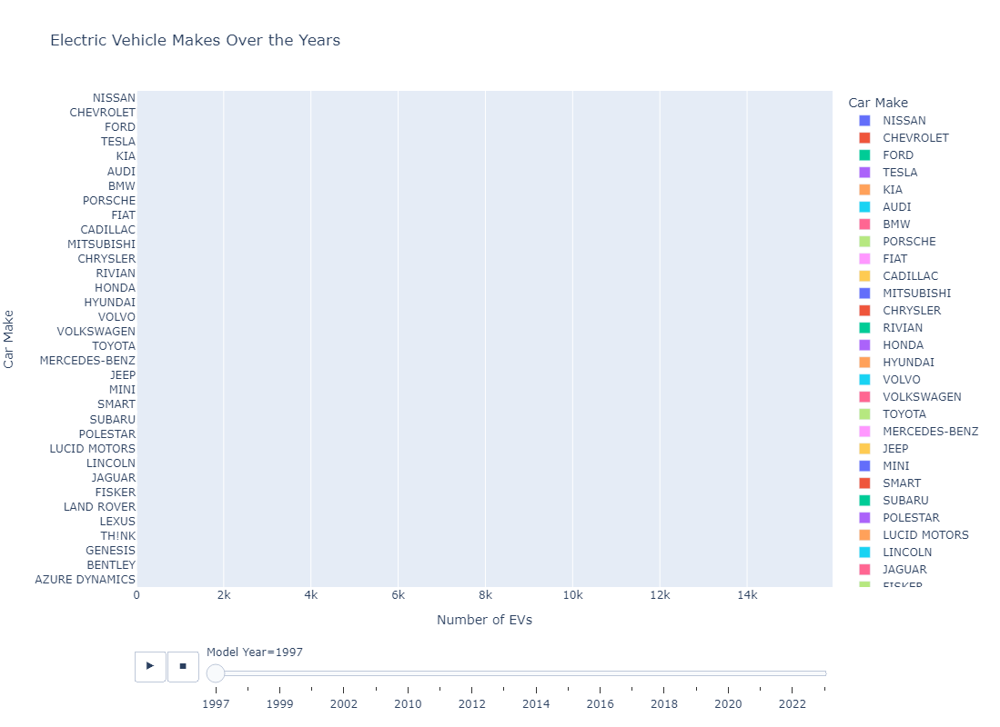

In [35]:
# Approch 1

# Step 1: Aggregate data by Make and Model Year
ev_make_by_year = data.groupby(['Model Year', 'Make']).size().reset_index(name='EV Count')

# Step 2: Create a list of all unique makes
unique_makes = data['Make'].unique()

# Step 3: Ensure all makes appear in every year by filling missing combinations
all_years = pd.DataFrame({'Model Year': sorted(data['Model Year'].unique())})
all_combinations = all_years.assign(key=1).merge(pd.DataFrame({'Make': unique_makes, 'key':1}), on='key').drop('key', axis=1)
ev_make_by_year_full = all_combinations.merge(ev_make_by_year, on=['Model Year', 'Make'], how='left').fillna(0)

# Step 4: Convert EV Count to integer (since it was NaN before)
ev_make_by_year_full['EV Count'] = ev_make_by_year_full['EV Count'].astype(int)

# Step 5: Create the animated racing bar plot with increased height
fig = px.bar(
    ev_make_by_year_full,  # Data
    x='EV Count',  # X-axis shows the count of EVs
    y='Make',  # Y-axis shows the car Make
    color='Make',  # Color by car Make
    animation_frame='Model Year',  # Animation by year
    orientation='h',  # Horizontal bar chart
    title='Electric Vehicle Makes Over the Years',
    labels={'EV Count':'Number of EVs', 'Make':'Car Make'},  # Axis labels
    range_x=[0, ev_make_by_year_full['EV Count'].max() * 1.1],  # Dynamically set x-axis range
    height=800  # Increased height for better visibility
)

# Step 6: Show the plot
fig.show()


MovieWriter imagemagick unavailable; using Pillow instead.


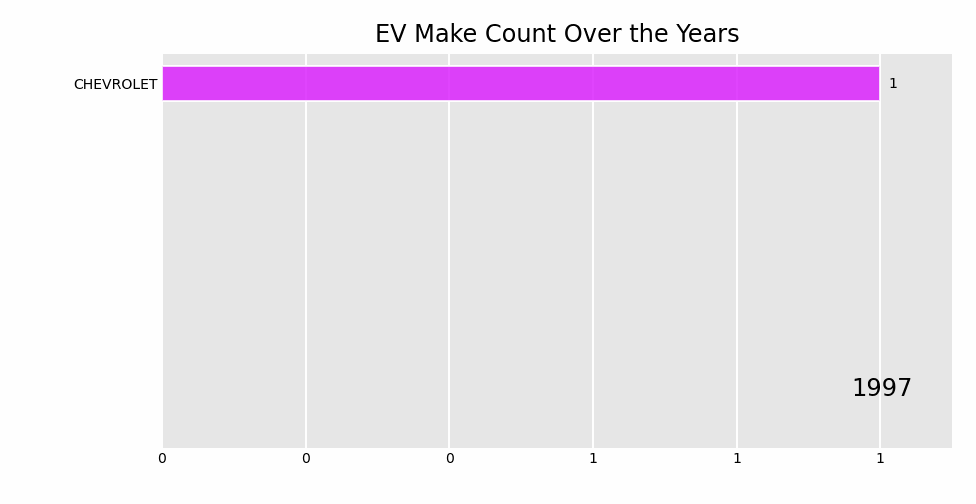

In [41]:
# Approch 2
data['Model Year'] = data['Model Year'].astype(str)

grouped_data = data.groupby(['Model Year', 'Make']).size().reset_index(name='Count')
pivoted_data = grouped_data.pivot(index='Model Year', columns='Make', values='Count')

# Create the bar chart race and save it as a .gif
bcr.bar_chart_race(
    df=pivoted_data, 
    filename='EV_make_racing_bar_plot.gif',  # Saves as .gif
    orientation='h', 
    sort='desc', 
    n_bars=10, 
    title='EV Make Count Over the Years', 
    filter_column_colors=True,  
    period_length=1000
)

# Display the .gif in the Jupyter notebook
Image(filename='EV_make_racing_bar_plot.gif')

### 🚘 Task 4:
Write a Linkedin Post which reflects your work and experience for this project. Don’t forget to tag Innomatics Research Labs in your posts.

In [ ]:
🚀 Excited to share my latest project on Electric Vehicle Data Analysis! 🚗🔋

Over the past few days, I had the opportunity to dive deep into a comprehensive dataset, applying various data science techniques to explore the landscape of electric vehicles in the U.S. Here's a quick overview of what I accomplished:

📊 Exploratory Data Analysis:

Conducted detailed Univariate Analysis and Bivariate Analysis to understand the distribution of key features like Electric Range, Base MSRP, and Make across different states and vehicle types.
Analyzed relationships between variables using correlation matrices and visualized patterns through scatter plots and box plots.
🌍 Choropleth Map:

Created an interactive choropleth map using Plotly to display the distribution of electric vehicles across various U.S. states.
🏎️ Racing Bar Plot:

Developed an animated Racing Bar Plot to showcase the evolving count of electric vehicle manufacturers over the years, highlighting trends in the EV industry.
This project has been a fantastic learning experience, allowing me to refine my skills in data manipulation, visualization, and storytelling with data.

Big thanks to Innomatics Research Labs for providing the platform to work on such cutting-edge projects and pushing my data science journey forward! 🙌

#DataScience #ElectricVehicles #EDA #DataVisualization #Plotly #Python #InnomaticsResearchLabs #EVAnalysis #CleanEnergy